# **XAI Project - Explaining Sentiment Analysis of Yelp Reviews**
*Cosimo Palma - Muhammad Imran - Muhammad Waheed Sabir*

Installing and importing all necessary packages for Data - Preprocessing, Training and Explanation

In [47]:
from google.colab import drive
drive.mount('/content/drive')  #Importing "drive" to use document stored in cloud

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Lime, Shap and Eli5 are the chosen explanations algorithms

In [2]:
!pip install eli5

     |████████████████████████████████| 106 kB 4.3 MB/s 


In [3]:
!pip install lime  #XAI module

     |████████████████████████████████| 275 kB 4.3 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=4a5fe72d6b30dd47ef92ce453440378ccd9dc9b136e1669d0aae637ad91afc67
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [4]:
!pip install shap   #XAI module

     |████████████████████████████████| 564 kB 4.4 MB/s 


In [5]:
!pip install aix360

     |████████████████████████████████| 58.3 MB 1.3 MB/s 
     |████████████████████████████████| 264 kB 49.7 MB/s 
     |████████████████████████████████| 377 kB 19.6 MB/s 
     |████████████████████████████████| 275 kB 43.1 MB/s 
     |████████████████████████████████| 109.7 MB 8.0 kB/s 
     |████████████████████████████████| 109.3 MB 44 kB/s 
     |████████████████████████████████| 50 kB 5.8 MB/s 
     |████████████████████████████████| 3.1 MB 20.5 MB/s 
     |████████████████████████████████| 488 kB 39.9 MB/s 
     |████████████████████████████████| 7.9 MB 14.6 MB/s 
     |████████████████████████████████| 121 kB 37.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for lime: filename=lime-0.1.1.37-py3-none-any.whl size=284290 sha256=ca2a68742e380fe9e546f97a41f1658a6cdf28792675e948d15e053d601d346f
  Stored in directory: /root/.cache/pip/wheels/5d/7a/8d/30e0ea15164fb80d5484e83ab991e18

In [6]:
import re    #regular expressions 
import string  # basic string manipulation
import csv      # basic csv manipulation
import pandas as pd #data analysis
import numpy as np #mathematical operations
import matplotlib.pyplot as plt #information visualization
import seaborn as sns #enhanced information visualization
from nltk.tokenize import word_tokenize  #NLP library
import nltk
nltk.download('punkt')
from nltk import FreqDist
%matplotlib inline   
#With this backend, the output of plotting commands is displayed inline within frontends like the Colab notebook, 
#directly below the code cell that produced it. The resulting plots will then also be stored in the notebook document.

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


# Data Exploration

The dataset chosen for our experiment is a set of yelp reviews

In [7]:
f= open('/content/drive/My Drive/XAI/yelp_review.csv', 'rb')
f = pd.read_csv(f) #, nrows=0).columns.tolist()
f.shape

(10000, 10)

With this procedure the dataset is splitted into training and testing dataset, and a new column is set: "Sentiment", a boolean semplification of the values displayed in "Label"

In [8]:
# Dataset splitting into train & test subsets along with numeric class labels
with open('/content/drive/My Drive/XAI/yelp_review.csv') as csv_yelp:
    count =  0 
    #for train data
    fsc_stars= []
    fsc_review= []
    fsc_sentiment= []
    #for test data
    fsc_stars_test=[]
    fsc_review_test=[]
    fsc_sentiment_test= []
    reader = csv.DictReader(csv_yelp)
    for row in reader:
      count += 1 
      fsc_stars.append(row["stars"])
      fsc_review.append(row["text"])
      if int(row["stars"]) < 3:
        fsc_sentiment.append("0")
      else:
        fsc_sentiment.append("1")
      if count > 4000 :      #for testing we just choose the first 1500 records 
        break 

    for row in reader:
      count += 1 
      fsc_stars_test.append(row['stars'])
      fsc_review_test.append(row['text'])
      if int(row["stars"]) < 3:
        fsc_sentiment_test.append("0")
      else:
        fsc_sentiment_test.append("1")
      if count > 5200:
        break
#print to review the list data 
print(fsc_stars)
print(fsc_review)
print(fsc_sentiment)
print("-----------------")
print(fsc_stars_test)
print(fsc_review_test)
print(fsc_sentiment_test)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



To better rearrange our dataset we use the pandas function "Dataframe"

In [9]:
d_train = pd.DataFrame(data={'content': fsc_review, 'label': fsc_stars, 'sentiment': fsc_sentiment })
d_test = pd.DataFrame(data={'content': fsc_review_test, 'label': fsc_stars_test, 'sentiment': fsc_sentiment_test})
print(d_train)
print(d_test)
#print(len(d_train['label']))


                                                content label sentiment
0     My wife took me here on my birthday for breakf...     5         1
1     I have no idea why some people give bad review...     5         1
2     love the gyro plate. Rice is so good and I als...     4         1
3     Rosie, Dakota, and I LOVE Chaparral Dog Park!!...     5         1
4     General Manager Scott Petello is a good egg!!!...     5         1
...                                                 ...   ...       ...
3996  I think I would have liked the food if I actua...     2         0
3997  modified is a great place to see a show.  it a...     4         1
3998  Still love their product, but their online ord...     4         1
3999  TJ was there for me when my water heater broke...     5         1
4000  We had fun but it is definately more for kids ...     3         1

[4001 rows x 3 columns]
                                                content label sentiment
0     "Gosh-Awful-Gooey Banana Split: f

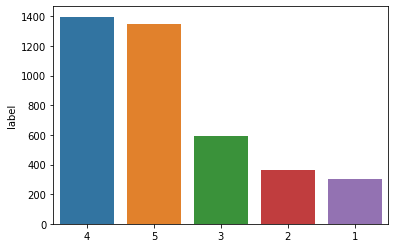

In [10]:
plot = sns.barplot(y = d_train.label.value_counts(), x = d_train.label.value_counts().index)

# Data Cleaning

In order to yeald a more accurate  training, data must be cleaned and preprocessed appropriately. Therefore all elements which do not bear meaningful sentiment values (Punctuation, Stopwords, as well as low frequency words) are removed

In [11]:
# Remove Punctionations from the text
def remove_punctuation(word):
    for punkt in list(string.punctuation):
        word = word.replace(punkt, '')
    return word    

In [12]:
from sklearn.feature_extraction import text

stop_words = text.ENGLISH_STOP_WORDS

# Remove Stop Words form the text
def cleansing(text):
    text = text.lower()
    word_list = word_tokenize(text)
    word_list = [word for word in word_list if len(word) > 2] #words shorter than three characters are excluded from the dataset
    word_list = [remove_punctuation(word) for word in word_list]  #punctuation is removed
    text = ' '.join(word_list)
    fdist = FreqDist(text)
    low_freq = list(filter(lambda x: x[1]<10,fdist.items()))  
    text = [w for w in word_list if not w.lower() in stop_words and not w.lower() in low_freq]  #low frequency words are removed
    text = ' '.join(word_list)
    return text

In [13]:
d_train['content_cleansing'] = d_train.content.apply(cleansing)
print(d_train['content_cleansing'])
print(d_train['content'])

0       wife took here birthday for breakfast and was ...
1       have idea why some people give bad reviews abo...
2       love the gyro plate rice good and also dig the...
3       rosie dakota and love chaparral dog park very ...
4       general manager scott petello good egg not int...
                              ...                        
3996    think would have liked the food actually ate w...
3997    modified great place see show almost reminds b...
3998    still love their product but their online orde...
3999    was there for when water heater broke and star...
4000    had fun but definately more for kids and young...
Name: content_cleansing, Length: 4001, dtype: object
0       My wife took me here on my birthday for breakf...
1       I have no idea why some people give bad review...
2       love the gyro plate. Rice is so good and I als...
3       Rosie, Dakota, and I LOVE Chaparral Dog Park!!...
4       General Manager Scott Petello is a good egg!!!...
                   

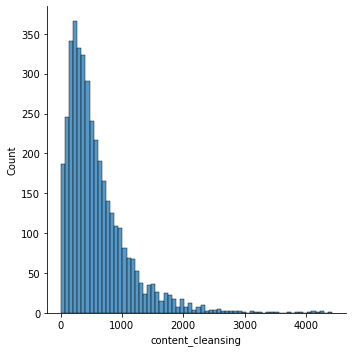

In [14]:
dist_plot = sns.displot(d_train.content_cleansing.apply(lambda x: len(x)))

Hereby a new column is created where the length of the related "content" field is displayed

In [15]:
d_train['cont_clean_len_token'] = d_train.content_cleansing.apply(lambda x: len(x))
print(d_train['cont_clean_len_token'])

0        776
1       1171
2         64
3        363
4        380
        ... 
3996     759
3997     140
3998     815
3999     180
4000     112
Name: cont_clean_len_token, Length: 4001, dtype: int64


# Stemming
By this operation words are brought to their basic form (lemmatization)
[deprecated]

In [16]:
from nltk.stem import LancasterStemmer #or "PorterStemmer"

ps = LancasterStemmer()
texttostem = ' '.join([str(elem) for elem in d_train['content_cleansing']])
#texttostem = word_tokenize(texttostem)
for word in texttostem.split():
  word = ps.stem(word)
  #print(word)

print(texttostem)

wife took here birthday for breakfast and was excellent the weather was perfect which made sitting outside overlooking their grounds absolute pleasure our waitress was excellent and our food arrived quickly the semibusy saturday morning looked like the place fills pretty quickly the earlier you get here the better yourself favor and get their bloody mary was phenomenal and simply the best ve ever had pretty sure they only use ingredients from their garden and blend them fresh when you order was amazing while everything the menu looks excellent had the white truffle scrambled eggs vegetable skillet and was tasty and delicious came with pieces their griddled bread with was amazing and absolutely made the meal complete was the best toast ve ever had anyway nt wait back have idea why some people give bad reviews about this place goes show you you can please everyone they are probably griping about something that their own fault  there are many people like that any case friend and arrived a

In [17]:
# split the dataset into training and validation datasets 
texts_train = d_train['content_cleansing'].values
texts_test = d_test['content'].values
yy_train = pd.to_numeric(d_train['sentiment']).values
yy_test =  pd.to_numeric(d_test['sentiment']).values

#Count Vectors for Dataset

With the sklearn library we use a function (CountVectorizer) to create a type-dictionary of our dataset. Each word will be treated as a feature. This kind of processing is necessary to be able to assign a sentiment to each word.

In [18]:
from sklearn.feature_extraction.text import CountVectorizer

train = ' '.join([str(elem) for elem in d_train['content_cleansing']])
#texttostem = word_tokenize(texttostem)
#train = ' '.join([str(elem) for elem in texttostem])
train = train.split()

count_vectorizer =  CountVectorizer(max_features = 854) #max_features

feature_vector = count_vectorizer.fit(train)

features = feature_vector.get_feature_names_out()

train_ds_features = count_vectorizer.transform(train)

features_counts =  np.sum(train_ds_features.toarray(),axis=0)

features_counts = pd.DataFrame(dict(features = features, counts = features_counts))

#print(len(feature_vector.vocabulary_))

features_counts.sort_values('counts', ascending=False)[0:100]

,features,counts
729,the,26391
22,and,17352
806,was,8340
266,for,6113
728,that,5071
...,...,...
824,who,550
480,off,544
595,right,542
299,going,542


### Low frequency words identification (alternative to previous methods)




0

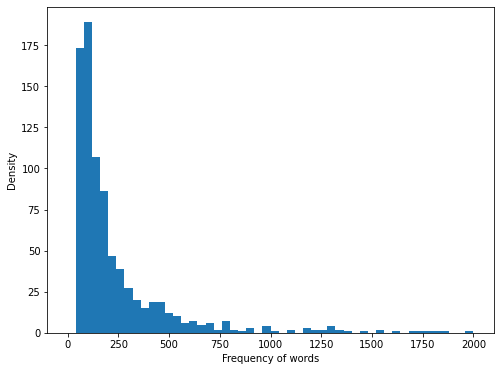

In [19]:
features_counts = np.sum(train_ds_features.toarray(),axis=0)

features_counts_df = pd.DataFrame(dict(features = features, counts = features_counts))

plt.figure(figsize=(8,6))

plt.hist(features_counts_df.counts, bins=50, range=(0,2000))

plt.xlabel("Frequency of words")

plt.ylabel('Density')

len(features_counts_df[features_counts_df.counts==1])

From this graph we can notice that the amount of positive reviews is pretty higher than the amount of negative ones

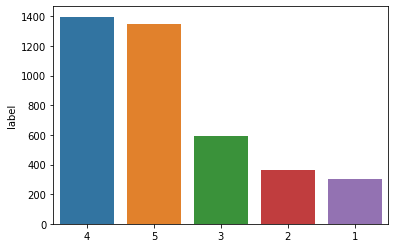

In [20]:
sns.barplot(y = d_train.label.value_counts(), x = d_train.label.value_counts().index)

# Distribution of words across different sentiments




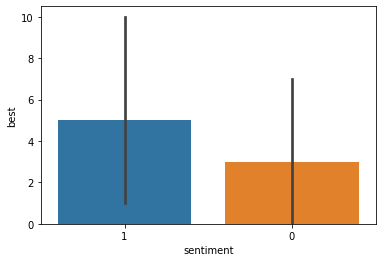

In [21]:
#train = ' '.join([str(elem) for elem in d_train['content_cleansing']])
train_ds_df = pd.DataFrame(train_ds_features.todense()) 

train_ds_df.columns = features

train_ds_df['sentiment'] = d_train['sentiment']
train_ds_df['label'] = d_train['label']
sns.barplot(x = 'sentiment',y = 'best', data = train_ds_df, estimator= sum)  #the word whose occurrence across the sentiments we would
#like to explore is inserted in the second function´s parameter (y). Here we make the case for "best", which counterintuitively displays a couple of
#negative occurrences as well



Other two examples showing labels instead of sentiments

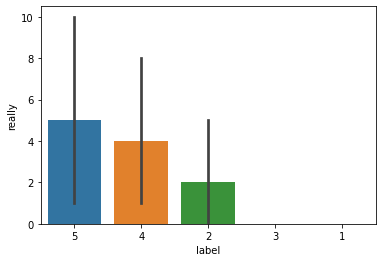

In [22]:
sns.barplot(x = 'label',y = 'really', data = train_ds_df, estimator= sum)

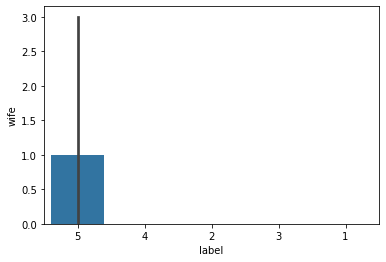

In [23]:
sns.barplot(x = 'label',y = 'wife', data = train_ds_df, estimator= sum)

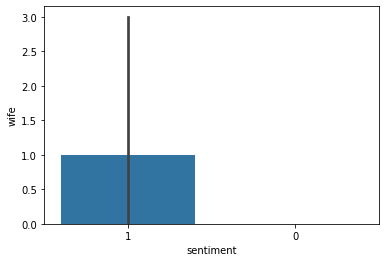

In [24]:
sns.barplot(x = 'sentiment',y = 'wife', data = train_ds_df, estimator= sum)

Another simple method to preprocess the dataset, is just taking in account very polarized reviews (1 or 5 stars). Thus the creation of the "Sentiment" column is not required

In [25]:
#Preparing for classification
f_class = f[(f['stars']==1) | (f['stars']==5)]
f_class.shape

#putting them in seperate variable
x = f_class['text']
y = f_class['stars']

Vectorization (as before, also simplified)

In [26]:
vectorizer = CountVectorizer(analyzer = cleansing).fit(texts_train)
print(len(vectorizer.vocabulary_))

50


In [27]:
review_0 = texts_train[0]
print(review_0)
vocab_0 = vectorizer.transform([review_0])
print(vocab_0)

print(vectorizer.get_feature_names()[23])
print(vectorizer.get_feature_names()[27])

wife took here birthday for breakfast and was excellent the weather was perfect which made sitting outside overlooking their grounds absolute pleasure our waitress was excellent and our food arrived quickly the semibusy saturday morning looked like the place fills pretty quickly the earlier you get here the better yourself favor and get their bloody mary was phenomenal and simply the best ve ever had pretty sure they only use ingredients from their garden and blend them fresh when you order was amazing while everything the menu looks excellent had the white truffle scrambled eggs vegetable skillet and was tasty and delicious came with pieces their griddled bread with was amazing and absolutely made the meal complete was the best toast ve ever had anyway nt wait back
  (0, 0)	124
  (0, 11)	53
  (0, 12)	14
  (0, 13)	14
  (0, 14)	31
  (0, 15)	96
  (0, 16)	12
  (0, 17)	15
  (0, 18)	33
  (0, 19)	36
  (0, 21)	10
  (0, 22)	36
  (0, 23)	16
  (0, 24)	29
  (0, 25)	32
  (0, 26)	9
  (0, 27)	2
  (0

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [28]:
#Now applying vectorization to the full review set which would check the shape of new x
x = vectorizer.transform(x)
print('Shape of Sparse Matrix: ', x.shape)
print('Amount of Non-Zero occurrences: ', x.nnz)

Shape of Sparse Matrix:  (4086, 50)
Amount of Non-Zero occurrences:  100555


In [29]:
# Percentage of non-zero values
density = (100.0 * x.nnz / (x.shape[0] * x.shape[1]))
print("Density = ",density)

Density =  49.21928536465981


Splitting the transformed dataset into training data and test data in the proportion of 80:20 using the sklearn package train_test_split.
The splitting generally takes place at this point: after the preprocessing, before the training phase. Nonetheless, the previous dataset splitting method (and moment) is kept for pedagogical purposes 

In [30]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x, y,test_size=0.2,random_state=101)
print(x_train.shape)
print(x_train)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(3268, 50)
  (0, 0)	99
  (0, 11)	43
  (0, 12)	6
  (0, 13)	14
  (0, 14)	15
  (0, 15)	57
  (0, 16)	8
  (0, 17)	14
  (0, 18)	31
  (0, 19)	21
  (0, 20)	3
  (0, 21)	4
  (0, 22)	21
  (0, 23)	10
  (0, 24)	20
  (0, 25)	35
  (0, 26)	7
  (0, 28)	28
  (0, 29)	33
  (0, 30)	47
  (0, 31)	20
  (0, 32)	4
  (0, 33)	10
  (0, 35)	7
  (0, 36)	2
  :	:
  (3267, 0)	274
  (3267, 4)	4
  (3267, 11)	123
  (3267, 12)	17
  (3267, 13)	38
  (3267, 14)	72
  (3267, 15)	182
  (3267, 16)	31
  (3267, 17)	28
  (3267, 18)	86
  (3267, 19)	85
  (3267, 20)	1
  (3267, 21)	21
  (3267, 22)	77
  (3267, 23)	35
  (3267, 24)	78
  (3267, 25)	91
  (3267, 26)	19
  (3267, 28)	84
  (3267, 29)	92
  (3267, 30)	128
  (3267, 31)	33
  (3267, 32)	17
  (3267, 33)	37
  (3267, 35)	44
(3268,)
(818, 50)
(818,)


# Finally the training process can start. We are exploring  different models, so that the explanation can be performed on the one evaluated as most precise.

# **Multinomial Naive Bayes**

Based on the Bayes formula for conditional probability: P(A|B) = P(A) * P(B|A)/P(B)
Where we are calculating the probability of class A when predictor B is already provided.

P(B) = prior probability of B

P(A) = prior probability of class A

P(B|A) = occurrence of predictor B given class A probability

This formula helps in calculating the probability of the tags in the text.

In [31]:
#Building the model
from sklearn.naive_bayes import MultinomialNB
nb = MultinomialNB()
nb.fit(x_train, y_train)

#Testing our model
nb_predict = nb.predict(x_test)

#Creating the confusion matrix
from sklearn.metrics import confusion_matrix, classification_report
print(confusion_matrix(y_test, nb_predict))

print('\n')

#Creating the classification report
print(classification_report(y_test, nb_predict))  ### The model achieved 93% accuracy. 
                                                  ### However, since we know that there are some bias values, 
                                                  ### so let's just test it on a single review.

#positive single review
pos_review = f_class['text'][59]
pos_review

pos_review_t = vectorizer.transform([pos_review])
nb.predict(pos_review_t)[0]                       ### 5 star rating which is good as expected 


#Negative single review
neg_review = f_class['text'][281]
neg_review

neg_review_t = vectorizer.transform([neg_review])
nb.predict(neg_review_t)[0]                       ### 1 star rating which is fine as expected

[[ 53  97]
 [ 43 625]]


              precision    recall  f1-score   support

           1       0.55      0.35      0.43       150
           5       0.87      0.94      0.90       668

    accuracy                           0.83       818
   macro avg       0.71      0.64      0.67       818
weighted avg       0.81      0.83      0.81       818



5

# **K-NN (K-Nearest Neighbour) classifier**

K-NN is a non-parametric algorithm, which means it does not make any assumption on underlying data.
It is also called a lazy learner algorithm because it does not learn from the training set immediately instead it stores the dataset and at the time of classification, it performs an action on the dataset.
KNN algorithm at the training phase just stores the dataset and when it gets new data, then it classifies that data into a category that is much similar to the new data. 

In [32]:
#Building the model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)

#Testing our model on x_test
knn_predict = knn.predict(x_test)

#Creating the confusion matrix
from sklearn.metrics import confusion_matrix, classification_report
print(confusion_matrix(y_test, knn_predict))

print('\n')

#Creating the classification report
print(classification_report(y_test, knn_predict))    

[[ 12 138]
 [ 32 636]]


              precision    recall  f1-score   support

           1       0.27      0.08      0.12       150
           5       0.82      0.95      0.88       668

    accuracy                           0.79       818
   macro avg       0.55      0.52      0.50       818
weighted avg       0.72      0.79      0.74       818



# **Support Vector Machine**

Support Vector Machine (SVM) is a supervised machine learning algorithm that can be used for both classification or regression challenges.In the SVM algorithm, each data item is plotted as a point in n-dimensional space (where n is a number of features you have) with the value of each feature being the value of a particular coordinate. The classification is then performed by finding the hyper-plane that best differentiates the two classes 

In [33]:
#Building the model
from sklearn.svm import SVC
svm = SVC()
svm.fit(x_train, y_train)

#Testing our model on x_test
svm_predict = svm.predict(x_test)

#Creating the confusion matrix
from sklearn.metrics import confusion_matrix, classification_report
print(confusion_matrix(y_test, svm_predict))

print('\n')

#Creating the classification report
print(classification_report(y_test, svm_predict))    

[[  1 149]
 [  1 667]]


              precision    recall  f1-score   support

           1       0.50      0.01      0.01       150
           5       0.82      1.00      0.90       668

    accuracy                           0.82       818
   macro avg       0.66      0.50      0.46       818
weighted avg       0.76      0.82      0.74       818



# **Random Forest Classifier**

A random forest is a supervised machine learning algorithm that is constructed from decision tree algorithms. The (random forest) algorithm establishes the outcome based on the predictions of the decision trees. It predicts by taking the average or mean of the output from various trees. Increasing the number of trees increases the precision of the outcome.

In [34]:
#Building the model
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(x_train, y_train)

#Testing our model on x_test
rf_predict = rf.predict(x_test)

#Creating the confusion matrix
from sklearn.metrics import confusion_matrix, classification_report
print(confusion_matrix(y_test, rf_predict))

print('\n')

#Creating the classification report
print(classification_report(y_test, rf_predict))    

[[  7 143]
 [  3 665]]


              precision    recall  f1-score   support

           1       0.70      0.05      0.09       150
           5       0.82      1.00      0.90       668

    accuracy                           0.82       818
   macro avg       0.76      0.52      0.49       818
weighted avg       0.80      0.82      0.75       818




# **Bi-GRU-LSTM-CNN**
Bi-directional Gated Recurrent Unit Long Short Term Memory Convolutional Neural Networks



In [35]:
from sklearn.base import BaseEstimator, TransformerMixin
from keras.models import Model, Input
from keras.layers import Dense, LSTM, Dropout, Embedding, SpatialDropout1D, Bidirectional, concatenate, Flatten, GlobalAveragePooling1D, GlobalMaxPooling1D, concatenate, Conv1D, GRU
from keras.utils.vis_utils import plot_model
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import accuracy_score
from keras import backend as K 

#K.clear_session()

class KerasTextClassifier(BaseEstimator, TransformerMixin):
    'Wrapper class for keras text classification models that takes raw text as input.'
    def __init__(self, max_words=10000, input_length=100, emb_dim=20, n_classes=3, epochs=5, batch_size=32):
        self.max_words = max_words
        self.input_length = input_length
        self.emb_dim = emb_dim
        self.n_classes = n_classes
        self.epochs = epochs
        self.bs = batch_size
        self.classes_ = None
        self.model = self._get_model()
        self.tokenizer = Tokenizer(num_words=self.max_words+1,
                                   lower=True, split=' ', oov_token="UNK")
    
    def _get_model(self):
        input_text = Input((self.input_length,))
        text_embedding = Embedding(input_dim=self.max_words + 2, output_dim=self.emb_dim,
                                   input_length=self.input_length, mask_zero=False)(input_text)
        text_embedding = SpatialDropout1D(0.5)(text_embedding)
        x = Bidirectional(GRU(units=32, return_sequences = True))(text_embedding)
        x = Conv1D(int(32/2), kernel_size = 2, padding = "valid", kernel_initializer = "he_uniform")(x)

        y = Bidirectional(LSTM(units=32, return_sequences=True))(text_embedding)
        y = Conv1D(int(32/2), kernel_size = 2, padding = "valid", kernel_initializer = "he_uniform")(y)
        

        avg_pool1 = GlobalAveragePooling1D()(x)
        max_pool1 = GlobalMaxPooling1D()(x)
    
        avg_pool2 = GlobalAveragePooling1D()(y)
        max_pool2 = GlobalMaxPooling1D()(y)

        x = concatenate([avg_pool1, max_pool1, avg_pool2, max_pool2])

        x = Dense(500, activation="relu")(x)
        x = Dropout(0.5)(x)
        out = Dense(units=self.n_classes, activation="softmax")(x)
        model = Model(input_text, out)
        model.compile(optimizer="adam",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])
        plot_model(model, to_file='model_plot2.png',show_shapes=True, show_layer_names=True)
        return model
    
    def _get_sequences(self, texts):
        seqs = self.tokenizer.texts_to_sequences(texts)
        return pad_sequences(seqs, maxlen=self.input_length, value=0)
    
    def _preprocess(self, texts):
        return [re.sub("[^a-zA-Z]", " ", texts) for x in texts]
    
                          
    def fit(self, X, y):
        '''
        Fit the vocabulary and the model.
        
        :params:
        X: list of texts.
        y: labels.
        '''
        
        self.tokenizer.fit_on_texts(self._preprocess(X))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.max_words}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
        seqs = self._get_sequences(self._preprocess(X))
        self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)
    
    def predict_proba(self, X, y=None):
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.predict(seqs)
    
    def predict(self, X, y=None):
        return np.argmax(self.predict_proba(X), axis=1)
    
    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)
    
    def trasnform(self, X):
        return self._get_sequences(self._preprocess(X))

    def _encode_label(self, y):
        return self.label_encoder.transform(y)
        
    def _decode_label(self, y):
        return self.label_encoder.inverse_transform(y)

    def _init_label_encoder(self, y):
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(y)
        self.classes_ = self.label_encoder.classes_

    def _encode_feature(self, x):
        self.tokenizer.fit_on_texts(self._preprocess(x))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.word_cnt}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.word_cnt + 1
        return self._get_sequences(self._preprocess(x))

    def predict_decode(self, X, y=None):
        return self._decode_label(self.predict(X))
        
    def summary(self):
       return self.model.summary()

text_model = KerasTextClassifier(epochs=4, max_words=10000, input_length=200)

Using TensorFlow backend.
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarn

In [36]:
text_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 200)          0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 200, 20)      200040      input_1[0][0]                    
__________________________________________________________________________________________________
spatial_dropout1d_1 (SpatialDro (None, 200, 20)      0           embedding_1[0][0]                
__________________________________________________________________________________________________
bidirectional_1 (Bidirectional) (None, 200, 64)      10176       spatial_dropout1d_1[0][0]        
____________________________________________________________________________________________

In [37]:
train = ' '.join([str(elem) for elem in d_train['content_cleansing']])[0:4001]
history = text_model.fit(train, yy_train)


Train on 3600 samples, validate on 401 samples
Epoch 1/4
3600/3600 [==============================] - 37s 10ms/step - loss: 0.5270 - accuracy: 0.8300 - val_loss: 0.4722 - val_accuracy: 0.8279
Epoch 2/4
3600/3600 [==============================] - 40s 11ms/step - loss: 0.4584 - accuracy: 0.8344 - val_loss: 0.4604 - val_accuracy: 0.8279
Epoch 3/4
3600/3600 [==============================] - 36s 10ms/step - loss: 0.4588 - accuracy: 0.8344 - val_loss: 0.4622 - val_accuracy: 0.8279
Epoch 4/4
3600/3600 [==============================] - 35s 10ms/step - loss: 0.4543 - accuracy: 0.8344 - val_loss: 0.4703 - val_accuracy: 0.8279


In [38]:
test = ' '.join([str(elem) for elem in d_test['content']])[0:1200]
text_model.score(test, yy_test)

0.8416666666666667

# **Bi-LSTM MODEL**

Bi-directional long short term memory (Bi-LSTM) is a kind of LSTM model which has the ability to process the data in both forward and backward directions. Bi LSTM a sequence processing model consists of two LSTMs: one takes the input in forward direction, and the other in backwards direction. This model has shown to deliver better results according to accuracy, for which reason will be used in the explanation section as well.

In [39]:
from sklearn.base import BaseEstimator, TransformerMixin #BaseEstimator just gives it the get_params and set_params methods that all Scikit-learn estimators
from keras.models import Model, Input #Keras is used for creating deep models 
#Dense  layer is the regular deeply connected neural network layer.
#It is most common and frequently used layer.
#Dense layer does the below operation on the input and return the output.
#Dropout layer randomly sets input units to 0 with a frequency of rate at each step during training time and SpatialDropout1D is subversion
#Embedding layer enables us to convert each word into a fixed length vector of defined size
#Layer that concatenates a list of inputs
#Flatten is used to flatten the input
from keras.layers import Dense, Embedding, Bidirectional, concatenate, Flatten 
from keras.layers import LSTM , Dropout , SpatialDropout1D
from keras.layers import GlobalAveragePooling1D, GlobalMaxPooling1D
from keras.utils.vis_utils import plot_model #Converts a Keras model to dot format and save to a file
from keras.preprocessing.text import Tokenizer # The Tokenizer class of Keras is used for vectorizing a text corpus
from keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import accuracy_score
import regex as re
import numpy as np
# Wrapper class from keras text-classification models that takes raw text as input.
class KerasTextClassifier(BaseEstimator, TransformerMixin):    
    
    def __init__(self, max_words=30000, input_length=100, emb_dim=20, n_classes=3, epochs=5, batch_size=32):
        self.max_words = max_words
        self.input_length = input_length
        self.emb_dim = emb_dim
        self.n_classes = n_classes
        self.epochs = epochs
        self.bs = batch_size
        self.classes_ = None
        self.model = self._get_model()
        self.tokenizer = Tokenizer(num_words=self.max_words+1,
                                   lower=True, split=' ', oov_token="UNK")
    
    def _get_model(self):
        input_text = Input((self.input_length,))
        text_embedding = Embedding(input_dim=self.max_words + 2, output_dim=self.emb_dim,
                                   input_length=self.input_length, mask_zero=False)(input_text)
        text_embedding = SpatialDropout1D(0.5)(text_embedding)
        bilstm = Bidirectional(LSTM(units=32, return_sequences=True, recurrent_dropout=0.5))(text_embedding)
        # x = concatenate([GlobalAveragePooling1D()(bilstm), GlobalMaxPooling1D()(bilstm)])
        flatten_layer = Flatten()
        x= flatten_layer(bilstm)
        # Dense layer with "ReLU" activation
        x = Dense(512, activation="relu")(x)
        # Dropout layer
        x = Dropout(0.5)(x)
        # Dense layer with "Softmax" activation
        out = Dense(units=self.n_classes, activation="softmax")(x)
        model = Model(input_text, out)

        # Specifying the training configurations (optimizer, loss function, accuracy metrics)
        model.compile(optimizer="adam", # Optimizer
                      # Loss function to minimize
                      loss="sparse_categorical_crossentropy", 
                      # Accuracy Metrics to monitor
                      metrics=["accuracy"])
        plot_model(model, to_file='model_plot.png',show_shapes=True, show_layer_names=True)
        return model
    
    def _get_sequences(self, texts):
        seqs = self.tokenizer.texts_to_sequences(texts)
        return pad_sequences(seqs, maxlen=self.input_length, value=0)
    
    def _preprocess(self, texts):
        return [re.sub(r"\d", "DIGIT", x) for x in texts]
    
    def fit(self, X, y):
        '''
        Fit the vocabulary and the model.
        
        :params:
        X: list of texts.
        y: labels.
        '''
        
        self.tokenizer.fit_on_texts(self._preprocess(X))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.max_words}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
        seqs = self._get_sequences(self._preprocess(X))
        self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)
    
    def predict_proba(self, X, y=None):
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.predict(seqs)
    
    def predict(self, X, y=None):
        return np.argmax(self.predict_proba(X), axis=1)
    
    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)
    
    def trasnform(self, X):
        return self._get_sequences(self._preprocess(X))

    def _encode_label(self, y):
        return self.label_encoder.transform(y)
        
    def _decode_label(self, y):
        return self.label_encoder.inverse_transform(y)

    def _init_label_encoder(self, y):
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(y)
        self.classes_ = self.label_encoder.classes_

    def _encode_feature(self, x):
        self.tokenizer.fit_on_texts(self._preprocess(x))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.word_cnt}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.word_cnt + 1
        return self._get_sequences(self._preprocess(x))

    def predict_decode(self, X, y=None):
        return self._decode_label(self.predict(X))
        
    def summary(self):
       return self.model.summary()
text_model2 = KerasTextClassifier(epochs=2, max_words=20000, input_length=200)

In [40]:
text_model2.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 200)               0         
_________________________________________________________________
embedding_2 (Embedding)      (None, 200, 20)           400040    
_________________________________________________________________
spatial_dropout1d_2 (Spatial (None, 200, 20)           0         
_________________________________________________________________
bidirectional_3 (Bidirection (None, 200, 64)           13568     
_________________________________________________________________
flatten_1 (Flatten)          (None, 12800)             0         
_________________________________________________________________
dense_3 (Dense)              (None, 512)               6554112   
_________________________________________________________________
dropout_2 (Dropout)          (None, 512)               0   

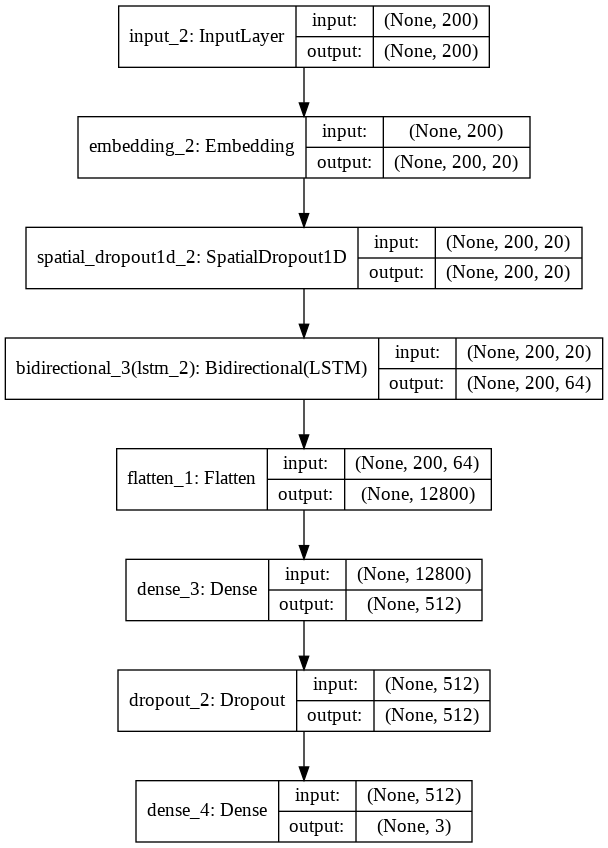

In [41]:
from IPython.display import Image
Image(filename='model_plot.png')

In [42]:
history = text_model2.fit(texts_train, yy_train)

Train on 3600 samples, validate on 401 samples
Epoch 1/2
3600/3600 [==============================] - 31s 9ms/step - loss: 0.4721 - accuracy: 0.8289 - val_loss: 0.4105 - val_accuracy: 0.8279
Epoch 2/2
3600/3600 [==============================] - 30s 8ms/step - loss: 0.2967 - accuracy: 0.8825 - val_loss: 0.3514 - val_accuracy: 0.8628


In [43]:
text_model2.score(texts_test, yy_test)

0.8733333333333333

In the following section the explanation methods SHAP, LIME and ELI5 are used. 

## **Explaining with SHAP Explaination (kernel Explaination)**


SHAP is a viable library which helps to make pretty visualizations of simple numeric measures to see which features mattered to a model. This helps to make comparisons between features easily, and one can present the resulting graphs to non-technical audiences to explain the internal mechanism of the black box models.

In [44]:
encoded_x_train = text_model2.trasnform(texts_train)
encoded_x_test = text_model2.trasnform(texts_test)

In [45]:
# Generate the description of Integer numbers i.e 50 to Fifty
def prepare_explanation_words(pipeline, encoded_x):
    words = pipeline.tokenizer.word_index
    num2word = {}
    for w in words.keys():
        num2word[words[w]] = w
    x_test_words = np.stack([
        np.array(list(map(
            lambda x: num2word.get(x, "NONE"), encoded_x[i])
                     )) for i in range(10)])

    return x_test_words

In [48]:
import shap

# Initialize SHAP Js to display explaination visualizations
shap.initjs()

# Defining the SHAP explainer
kernel_explainer = shap.KernelExplainer(text_model2.model.predict, encoded_x_train[:10])

# Explain the sentiments of the pipeline on the first 10 samples
kernel_shap_values = kernel_explainer.shap_values(encoded_x_test[:10])

x_test_words = prepare_explanation_words(text_model, encoded_x_test)
y_pred = text_model2.predict(texts_test[:10])

  0%|          | 0/10 [00:00<?, ?it/s]

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
The default of 'normalize' will be set to False in version 1.2 and deprecated in ve

SHAP Explanation visualization for different dataset rows

In [49]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[6], y_pred[6]))

# Display explanation visualization
shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][6], x_test_words[6])

Actual Category: 5, Predict Category: 1


In [50]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (yy_test[9], y_pred[9]))

# Display explanation visualization
shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][9], x_test_words[9])

Actual Category: 1, Predict Category: 1


In [51]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (yy_test[8], y_pred[8]))

# Display explanation visualization
shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][8], x_test_words[8])

Actual Category: 1, Predict Category: 1


In [52]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()

# Display interactive explanation visualization
shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][:1000:,], x_test_words[6])

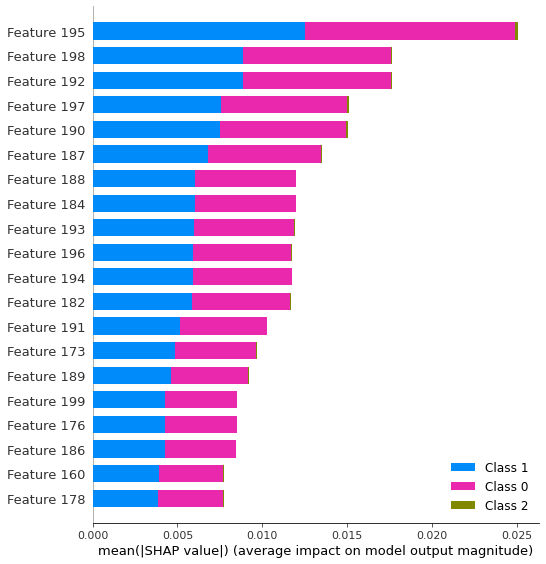

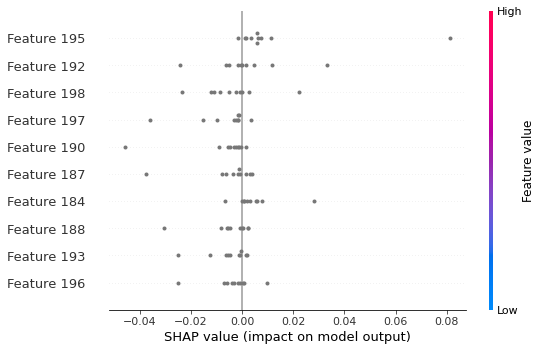

In [53]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()

# Display SHAP Summary Plots to highlight feature importance
shap.summary_plot(kernel_shap_values,features=x_test_words )
shap.summary_plot(kernel_shap_values[1],features=x_test_words ,max_display=10 )

SHAP summary plots give us a birds-eye view of feature importance and what is driving it. The above shown plot is made of many dots. Each dot has three characteristics:


*   Vertical location shows what feature it is depicting
*   Color shows whether that feature was high or low for that row of the dataset
*   Horizontal location shows whether the effect of that value caused a higher or lower prediction

In [54]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (yy_test[9], y_pred[9]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][9], x_test_words[9])

Actual Category: 1, Predict Category: 1


In [55]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (yy_test[8], y_pred[8]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][8], x_test_words[8])

Actual Category: 1, Predict Category: 1


### **Explain the Visualization** 

*   This force plot of Kernel Explanation explains how different features pushed and pulled on the output to move it from the base_value to the model output value or prediction. The prediction of this kernel explanation is the probability or confidence that the review is 100% belong to predicted category  ("Negative" Class).


##**Explaining with Lime**

Sample 6: last 80 words (only part used by the model)
--------------------------------------------------
had the mint with paul newman oreos!) which I scarfed down after being totally stuffed. This place is ridiculously good. And reasonably priced. And fresh. And not stuffy or pretentious in anyway. Basically, this would be our new steady if we lived anywhere near... Tempe. Which fortunately we do not, but I have to say, you Arizonians sure are stoked to have a place like Green. And now we have a reason to look forward to returning to AZ!! :D
--------------------------------------------------
Probability(positive) = 0.9687996
True class:  5


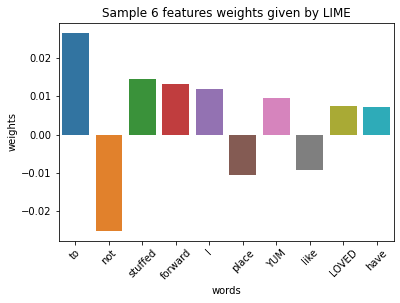

In [56]:
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine() #removes the spines from the right and upper portion in plot
# We choose a sample from test set
#text sample from test set
idx =6
idx2 =9
idx3=8
text_sample = texts_test[idx]
text_sample2 = texts_test[idx2]
text_sample3 = texts_test[idx3]
class_names = ['Negative', 'Positive']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model2.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx]) #print in actual classes

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model2.predict_proba, num_features=10) #Passing sample text and prediction and feature to LIME explainer 

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [57]:
explanation.show_in_notebook(text=True)

Sample 9: last 80 words (only part used by the model)
--------------------------------------------------
had the mint with paul newman oreos!) which I scarfed down after being totally stuffed. This place is ridiculously good. And reasonably priced. And fresh. And not stuffy or pretentious in anyway. Basically, this would be our new steady if we lived anywhere near... Tempe. Which fortunately we do not, but I have to say, you Arizonians sure are stoked to have a place like Green. And now we have a reason to look forward to returning to AZ!! :D
--------------------------------------------------
Probability(positive) = 0.9687996
True class:  1


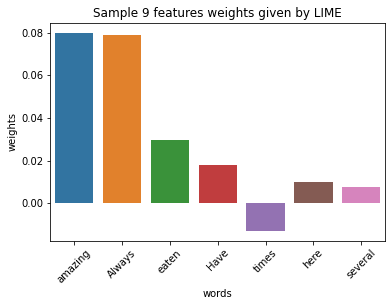

In [58]:
#applying sample idx2
print('Sample {}: last 80 words (only part used by the model)'.format(idx2))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model2.predict_proba([text_sample])[0,1])
print("True class: ",yy_test[idx2])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample2, text_model2.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})



sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx2));

In [59]:
explanation.show_in_notebook(text=True)

Sample 8: last 80 words (only part used by the model)
--------------------------------------------------
had the mint with paul newman oreos!) which I scarfed down after being totally stuffed. This place is ridiculously good. And reasonably priced. And fresh. And not stuffy or pretentious in anyway. Basically, this would be our new steady if we lived anywhere near... Tempe. Which fortunately we do not, but I have to say, you Arizonians sure are stoked to have a place like Green. And now we have a reason to look forward to returning to AZ!! :D
--------------------------------------------------
Probability(positive) = 0.9687996
True class:  1


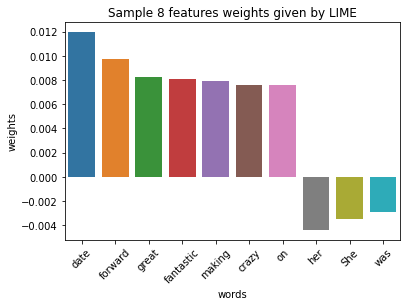

In [60]:
#Applying the sample text idx3
print('Sample {}: last 80 words (only part used by the model)'.format(idx3))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model2.predict_proba([text_sample])[0,1])
print("True class: ",yy_test[idx3])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample3, text_model2.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})



sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx3));

In [61]:
explanation.show_in_notebook(text=True)

### **Explain the Visualization** 


*   On the "Text with higligted words", the blue words made the classifier think that the review was more negative while the yellow words made the review seem more positive.

*   The explainer predicts that this review should be labeled as "positive" with the probability of above 90%.


With LIME methods of explanation, it is easy for Human to intrepret and understand the prediction. LIME allows us to extract some important word that mostly contribute to the prediction, and even give the rational number "Negative" or "Positive" contribution of each word of sample.

# **ELI5 explainable model**

In [62]:
from sklearn.base import BaseEstimator, TransformerMixin
from keras.models import Model, Input
#Keras is used for creating deep models 
#Dense  layer is the regular deeply connected neural network layer.
#It is most common and frequently used layer.
#Dense layer does the below operation on the input and return the output.
#Dropout layer randomly sets input units to 0 with a frequency of rate at each step during training time and SpatialDropout1D is subversion
#Embedding layer enables us to convert each word into a fixed length vector of defined size
#Layer that concatenates a list of inputs
from keras.layers import Dense, LSTM, Dropout, Embedding, SpatialDropout1D, Bidirectional, concatenate
from keras.layers import GlobalAveragePooling1D, GlobalMaxPooling1D
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import accuracy_score
from eli5.lime import TextExplainer
import regex as re # Regular Expression, is a sequence of characters that forms a search pattern
import numpy as np #NumPy is a Py lib used for working with arrays and provide fundamental packages for scientific computing

class KerasTextClassifier(BaseEstimator, TransformerMixin):
    '''Wrapper class for keras text classification models that takes raw text as input.'''
    
    def __init__(self, max_words=30000, input_length=100, emb_dim=20, n_classes=4, epochs=5, batch_size=32):
        self.max_words = max_words
        self.input_length = input_length
        self.emb_dim = emb_dim
        self.n_classes = n_classes
        self.epochs = epochs
        self.bs = batch_size
        self.model = self._get_model()
        self.tokenizer = Tokenizer(num_words=self.max_words+1,
                                   lower=True, split=' ', oov_token="UNK")
    
    def _get_model(self):
        input_text = Input((self.input_length,))
        text_embedding = Embedding(input_dim=self.max_words + 2, output_dim=self.emb_dim,
                                   input_length=self.input_length, mask_zero=False)(input_text)
        text_embedding = SpatialDropout1D(0.5)(text_embedding)
        bilstm = Bidirectional(LSTM(units=32, return_sequences=True, recurrent_dropout=0.5))(text_embedding)
        x = concatenate([GlobalAveragePooling1D()(bilstm), GlobalMaxPooling1D()(bilstm)])
        x = Dropout(0.7)(x)
        x = Dense(512, activation="relu")(x)#ReLu is a non-linear activation function that is used in multi-layer neural networks or deep neural networks
        x = Dropout(0.6)(x)
        x = Dense(512, activation="relu")(x)
        x = Dropout(0.5)(x)
        out = Dense(units=self.n_classes, activation="softmax")(x)
        model = Model(input_text, out)
        model.compile(optimizer="adam",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])
        return model
    
    def _get_sequences(self, texts):
        seqs = self.tokenizer.texts_to_sequences(texts) #Transforms each text in texts to a sequence of integers
        return pad_sequences(seqs, maxlen=self.input_length, value=0)
    
    def _preprocess(self, texts):
        return [re.sub(r"\d", "DIGIT", x) for x in texts]
    
    def fit(self, X, y): #Fit the vocabulary and the model. :params: X: list of texts. y: labels.
     
        '''
        Fit the vocabulary and the model.
        
        :params:
        X: list of texts.
        y: labels.
        '''
        
        self.tokenizer.fit_on_texts(self._preprocess(X))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.max_words}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
        seqs = self._get_sequences(self._preprocess(X))
        self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)
    
    def predict_proba(self, X, y=None):
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.predict(seqs)
    
    def predict(self, X, y=None):
        return np.argmax(self.predict_proba(X), axis=1)
    
    def score(self, X, y): #return prediction score accuracy
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)


In [87]:
doc = texts_test[6]
te = TextExplainer(random_state=42)
te.fit(doc, text_model2.predict_proba)
te.show_prediction(target_names=yy_train.all())

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
